**Step 1: Download the Dataset from Roboflow**

In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="sU9eB2AmwzwynSFkqVaS")
project = rf.workspace("eyantra-twpmn").project("license-plate-detection-g15hx")
version = project.version(1)
dataset = version.download("coco")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 638.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.0 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to license-plate-detection-1 in coco:: 100%|██████████| 5411/5411 [00:02<00:00, 2188.04it/s]


**Step 2: Install Necessary Libraries**

In [ ]:
# !python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Cloning into 'detectron2'...
remote: Enumerating objects: 15737, done.
remote: Total 15737 (delta 0), reused 0 (delta 0), pack-reused 15737
Receiving objects: 100% (15737/15737), 6.32 MiB | 16.34 MiB/s, done.
Resolving deltas: 100% (11487/11487), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 63.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 20.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61400 sha256=f992130f0392ef87c884899ce0988bdcf6f522907d8d3320371b99d772517f9d
  Stored in directory: /root/.cache/pip/wheels/01/c0/af/77c1cf53a1be9e42a52b48e5af2169d40ec2e89f7

**Step 3: Register the Dataset with Detectron2**

In [ ]:
import os
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog

# Define paths to your dataset in Google Drive
base_path = '/content/license-plate-detection-1/'
train_path = os.path.join(base_path, 'train')
val_path = os.path.join(base_path, 'valid')
test_path = os.path.join(base_path, 'test')

train_annotations = os.path.join(train_path, '/content/license-plate-detection-1/train/_annotations.coco.json')
val_annotations = os.path.join(val_path, '/content/license-plate-detection-1/valid/_annotations.coco.json')
test_annotations = os.path.join(test_path, '/content/license-plate-detection-1/test/_annotations.coco.json')

# Register the COCO datasets
register_coco_instances("lp_train", {}, train_annotations, train_path)
register_coco_instances("lp_val", {}, val_annotations, val_path)
register_coco_instances("lp_test", {}, test_annotations, test_path)

lp_train_metadata = MetadataCatalog.get("lp_train")
lp_train_dataset = DatasetCatalog.get("lp_train")

lp_val_metadata = MetadataCatalog.get("lp_val")
lp_val_dataset = DatasetCatalog.get("lp_val")

lp_test_metadata = MetadataCatalog.get("lp_test")
lp_test_dataset = DatasetCatalog.get("lp_test")

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



**Step 4: Configure and Train the Model**

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("lp_train",) # Make sure this matches the name used when registering the dataset
cfg.DATASETS.TEST = ("lp_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(lp_train_metadata.thing_classes)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[07/01 22:10:03 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[07/01 22:10:04 d2.engine.train_loop]: Starting training from iteration 0


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[07/01 22:10:27 d2.utils.events]:  eta: 0:20:07  iter: 19  total_loss: 1.308  loss_cls: 1.04  loss_box_reg: 0.188  loss_rpn_cls: 0.07727  loss_rpn_loc: 0.00759    time: 1.1357  last_time: 1.2459  data_time: 0.0227  last_data_time: 0.0120   lr: 4.9953e-06  max_mem: 4314M
[07/01 22:10:50 d2.utils.events]:  eta: 0:18:07  iter: 39  total_loss: 1.302  loss_cls: 0.9433  loss_box_reg: 0.1806  loss_rpn_cls: 0.07771  loss_rpn_loc: 0.0113    time: 1.1291  last_time: 1.0807  data_time: 0.0116  last_data_time: 0.0056   lr: 9.9902e-06  max_mem: 4314M
[07/01 22:11:13 d2.utils.events]:  eta: 0:17:46  iter: 59  total_loss: 1.124  loss_cls: 0.7582  loss_box_reg: 0.3535  loss_rpn_cls: 0.03759  loss_rpn_loc: 0.009782    time: 1.1351  last_time: 0.9138  data_time: 0.0136  last_data_time: 0.0120   lr: 1.4985e-05  max_mem: 4314M
[07/01 22:11:34 d2.utils.events]:  eta: 0:17:17  iter: 79  total_loss: 1.027  loss_cls: 0.6123  loss_box_reg: 0.3451  loss_rpn_cls: 0.09516  loss_rpn_loc: 0.007881    time: 1.1184  

**Visualization in tensorboard**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

**Step 5: Evaluate the Model**

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Evaluate on validation set
evaluator = COCOEvaluator("lp_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "lp_val")
validation_results = inference_on_dataset(trainer.model, val_loader, evaluator)
print(validation_results)

# Evaluate on test set
evaluator = COCOEvaluator("lp_test", cfg, False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "lp_test")
test_results = inference_on_dataset(trainer.model, test_loader, evaluator)
print(test_results)


[07/01 22:29:16 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/01 22:29:16 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [07/01 22:29:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/01 22:29:16 d2.data.datasets.coco]: Loaded 220 images in COCO format from /content/license-plate-detection-1/valid/_annotations.coco.json
[07/01 22:29:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/01 22:29:16 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/01 22:29:16 d2.data.common]: Serializing 220 elements to byte tensors and concatenating them all ...
[07/01 22:29:16 d2.data.common]: Se

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[07/01 22:29:18 d2.evaluation.evaluator]: Inference done 11/220. Dataloading: 0.0015 s/iter. Inference: 0.1755 s/iter. Eval: 0.0003 s/iter. Total: 0.1772 s/iter. ETA=0:00:37
[07/01 22:29:23 d2.evaluation.evaluator]: Inference done 39/220. Dataloading: 0.0040 s/iter. Inference: 0.1767 s/iter. Eval: 0.0003 s/iter. Total: 0.1811 s/iter. ETA=0:00:32
[07/01 22:29:28 d2.evaluation.evaluator]: Inference done 67/220. Dataloading: 0.0039 s/iter. Inference: 0.1770 s/iter. Eval: 0.0004 s/iter. Total: 0.1815 s/iter. ETA=0:00:27
[07/01 22:29:33 d2.evaluation.evaluator]: Inference done 95/220. Dataloading: 0.0033 s/iter. Inference: 0.1773 s/iter. Eval: 0.0004 s/iter. Total: 0.1811 s/iter. ETA=0:00:22
[07/01 22:29:39 d2.evaluation.evaluator]: Inference done 123/220. Dataloading: 0.0038 s/iter. Inference: 0.1776 s/iter. Eval: 0.0004 s/iter. Total: 0.1819 s/iter. ETA=0:00:17
[07/01 22:29:44 d2.evaluation.evaluator]: Inference done 151/220. Dataloading: 0.0037 s/iter. Inference: 0.1780 s/iter. Eval: 0.0

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[07/01 22:29:57 d2.evaluation.evaluator]: Total inference time: 0:00:39.428386 (0.183388 s / iter per device, on 1 devices)
[07/01 22:29:57 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:38 (0.178748 s / iter per device, on 1 devices)
[07/01 22:29:57 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[07/01 22:29:57 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[07/01 22:29:57 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.569
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.908
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.628
 Average

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[07/01 22:29:59 d2.evaluation.evaluator]: Inference done 11/221. Dataloading: 0.0015 s/iter. Inference: 0.1816 s/iter. Eval: 0.0003 s/iter. Total: 0.1834 s/iter. ETA=0:00:38
[07/01 22:30:04 d2.evaluation.evaluator]: Inference done 39/221. Dataloading: 0.0018 s/iter. Inference: 0.1808 s/iter. Eval: 0.0003 s/iter. Total: 0.1830 s/iter. ETA=0:00:33
[07/01 22:30:09 d2.evaluation.evaluator]: Inference done 66/221. Dataloading: 0.0024 s/iter. Inference: 0.1816 s/iter. Eval: 0.0003 s/iter. Total: 0.1844 s/iter. ETA=0:00:28
[07/01 22:30:14 d2.evaluation.evaluator]: Inference done 93/221. Dataloading: 0.0036 s/iter. Inference: 0.1814 s/iter. Eval: 0.0003 s/iter. Total: 0.1854 s/iter. ETA=0:00:23
[07/01 22:30:19 d2.evaluation.evaluator]: Inference done 120/221. Dataloading: 0.0034 s/iter. Inference: 0.1817 s/iter. Eval: 0.0003 s/iter. Total: 0.1855 s/iter. ETA=0:00:18
[07/01 22:30:24 d2.evaluation.evaluator]: Inference done 148/221. Dataloading: 0.0033 s/iter. Inference: 0.1813 s/iter. Eval: 0.0

**Step 6: Make Predictions on Test Images**

[07/01 22:31:19 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


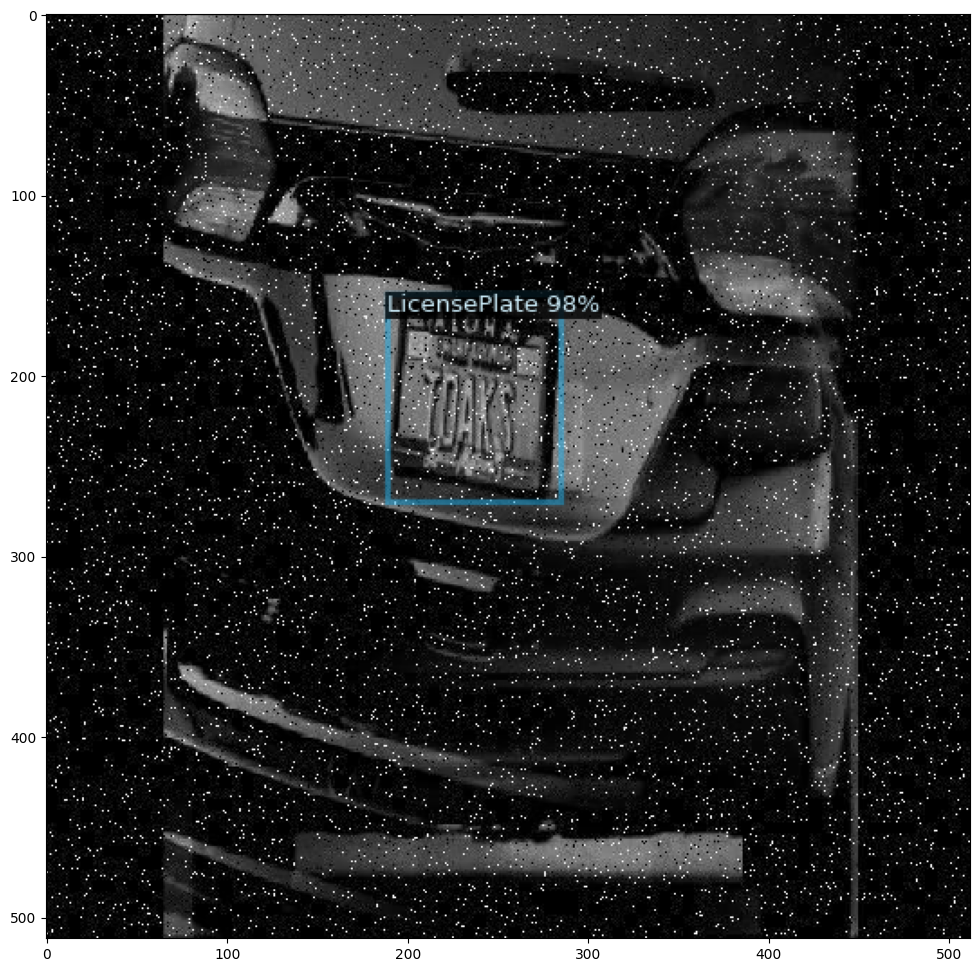

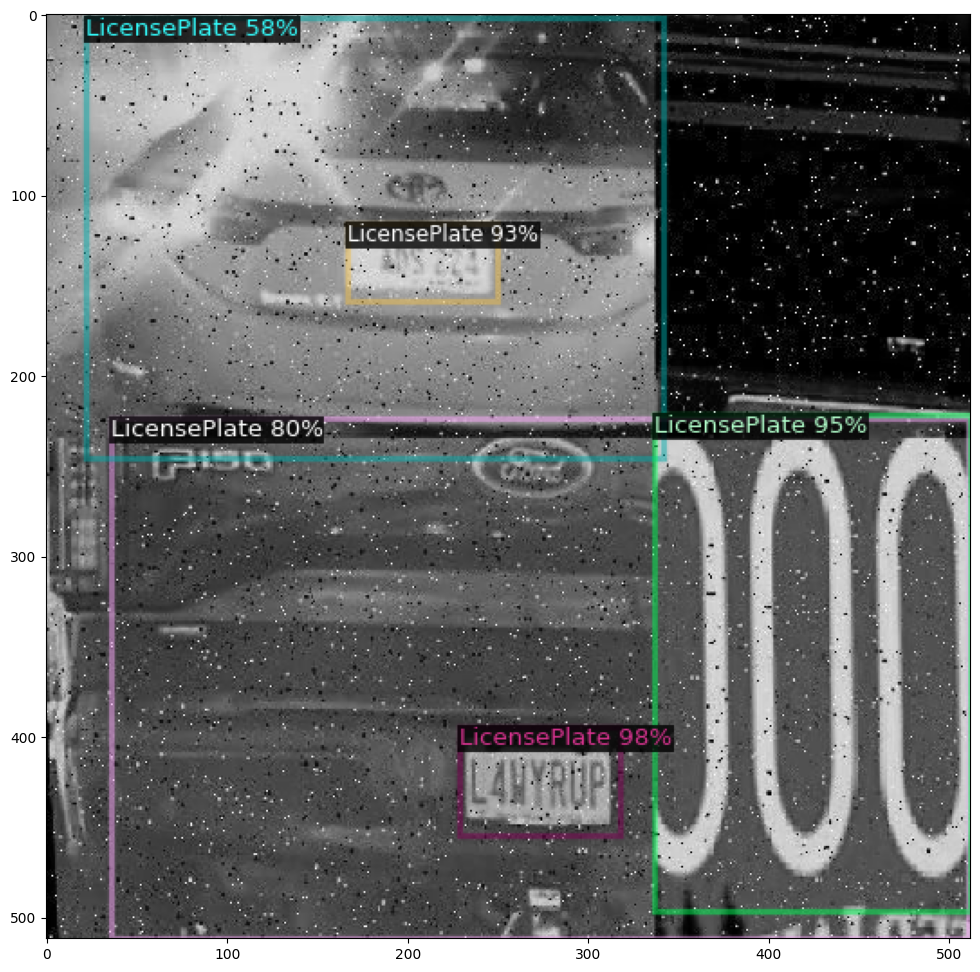

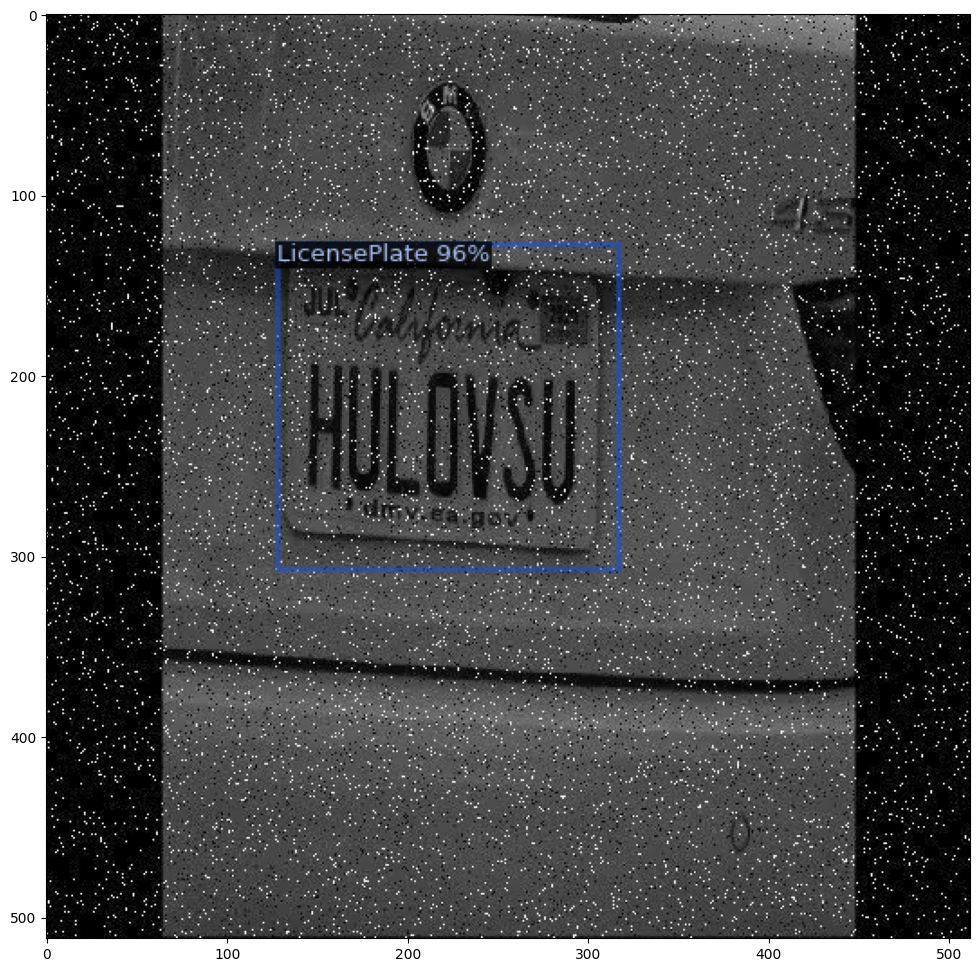

In [ ]:
from detectron2.utils.visualizer import ColorMode
from detectron2.engine.defaults import DefaultPredictor

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # Set the testing threshold for this model
predictor = DefaultPredictor(cfg)

import random
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

# Ensure the dataset is loaded correctly
dataset_dicts = lp_test_dataset

# Iterate through a few sample test images
for d in random.sample(dataset_dicts, 3):
    # Load the image
    im = cv2.imread(d["file_name"])

    # Run the predictor on the image
    outputs = predictor(im)

    # Visualize the output
    v = Visualizer(im[:, :, ::-1],
                   metadata=lp_test_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # Remove the colors of unsegmented pixels
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Display the image
    plt.figure(figsize=(12, 12))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()
